In [13]:
import os
import numpy as np
import torch
import torch.nn as nn
from scipy import io
import matplotlib.pyplot as plt
import math

# Define models exactly matching the original code structure
class Conv2d(nn.Module):
    def __init__(self, nch_in, nch_out, kernel_size=4, stride=1, padding=1, bias=True):
        super(Conv2d, self).__init__()
        self.conv = nn.Conv2d(nch_in, nch_out, kernel_size=kernel_size, stride=stride, padding=padding, bias=bias)

    def forward(self, x):
        return self.conv(x)

class Norm2d(nn.Module):
    def __init__(self, nch, norm_mode):
        super(Norm2d, self).__init__()
        if norm_mode == 'bnorm':
            self.norm = nn.BatchNorm2d(nch)
        elif norm_mode == 'inorm':
            self.norm = nn.InstanceNorm2d(nch)

    def forward(self, x):
        return self.norm(x)

class ReLU(nn.Module):
    def __init__(self, relu):
        super(ReLU, self).__init__()
        if relu > 0:
            self.relu = nn.LeakyReLU(relu, True)
        elif relu == 0:
            self.relu = nn.ReLU(True)

    def forward(self, x):
        return self.relu(x)

class Padding(nn.Module):
    def __init__(self, padding, padding_mode='zeros', value=0):
        super(Padding, self).__init__()
        if padding_mode == 'reflection':
            self.padding = nn.ReflectionPad2d(padding)
        elif padding_mode == 'replication':
            self.padding = nn.ReplicationPad2d(padding)
        elif padding_mode == 'constant':
            self.padding = nn.ConstantPad2d(padding, value)
        elif padding_mode == 'zeros':
            self.padding = nn.ZeroPad2d(padding)

    def forward(self, x):
        return self.padding(x)

class CNR2d(nn.Module):
    def __init__(self, nch_in, nch_out, kernel_size=4, stride=1, padding=1, norm='bnorm', relu=0.0, drop=[], bias=[]):
        super().__init__()

        if bias == []:
            if norm == 'bnorm':
                bias = False
            else:
                bias = True

        layers = []
        layers += [Conv2d(nch_in, nch_out, kernel_size=kernel_size, stride=stride, padding=padding, bias=bias)]

        if norm != []:
            layers += [Norm2d(nch_out, norm)]

        if relu != []:
            layers += [ReLU(relu)]

        if drop != []:
            layers += [nn.Dropout2d(drop)]

        self.cbr = nn.Sequential(*layers)

    def forward(self, x):
        return self.cbr(x)

class ResBlock(nn.Module):
    def __init__(self, nch_in, nch_out, kernel_size=3, stride=1, padding=1, padding_mode='reflection', norm='inorm', relu=0.0, drop=[], bias=[]):
        super().__init__()

        if bias == []:
            if norm == 'bnorm':
                bias = False
            else:
                bias = True

        layers = []

        # 1st conv
        layers += [Padding(padding, padding_mode=padding_mode)]
        layers += [CNR2d(nch_in, nch_out, kernel_size=kernel_size, stride=stride, padding=0, norm=norm, relu=relu)]

        if drop != []:
            layers += [nn.Dropout2d(drop)]

        # 2nd conv
        layers += [Padding(padding, padding_mode=padding_mode)]
        layers += [CNR2d(nch_in, nch_out, kernel_size=kernel_size, stride=stride, padding=0, norm=norm, relu=[])]

        self.resblk = nn.Sequential(*layers)

    def forward(self, x):
        return x + self.resblk(x)

class ResNet(nn.Module):
    def __init__(self, nch_in, nch_out, nch_ker=64, norm='bnorm', nblk=16):
        super(ResNet, self).__init__()

        self.nch_in = nch_in
        self.nch_out = nch_out
        self.nch_ker = nch_ker
        self.norm = norm
        self.nblk = nblk

        if norm == 'bnorm':
            self.bias = False
        else:
            self.bias = True

        self.enc1 = CNR2d(self.nch_in, self.nch_ker, kernel_size=3, stride=1, padding=1, norm=[], relu=0.0)

        res = []
        for i in range(self.nblk):
            res += [ResBlock(self.nch_ker, self.nch_ker, kernel_size=3, stride=1, padding=1, norm=self.norm, relu=0.0, padding_mode='reflection')]
        self.res = nn.Sequential(*res)

        self.dec1 = CNR2d(self.nch_ker, self.nch_ker, kernel_size=3, stride=1, padding=1, norm=norm, relu=[])

        self.conv1 = Conv2d(self.nch_ker, self.nch_out, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        x = self.enc1(x)
        x0 = x

        x = self.res(x)

        x = self.dec1(x)
        x = x + x0

        x = self.conv1(x)

        return x

# PSNR calculation function
def calculate_psnr(img1, img2, data_range=1.0):
    """Calculate PSNR between two images"""
    if isinstance(img1, torch.Tensor):
        img1 = img1.detach().cpu().numpy()
    if isinstance(img2, torch.Tensor):
        img2 = img2.detach().cpu().numpy()
    
    # Ensure images have the same shape
    assert img1.shape == img2.shape, f"Images must have the same dimensions. Got {img1.shape} and {img2.shape}"
    
    # Calculate MSE
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')  # Perfect similarity
    
    # Calculate PSNR
    psnr = 20 * math.log10(data_range / math.sqrt(mse))
    
    return psnr

def denoise_and_evaluate(model_path, clean_path, noisy_path, norm_method='adaptive', output_dir=None):
    """
    Load a trained Noise2Void model, apply it to a noisy image, and calculate PSNR.
    
    Args:
        model_path: Path to the model checkpoint file (e.g., 'checkpoints/model_epoch0020.pth')
        clean_path: Path to the original/clean .mat file
        noisy_path: Path to the noisy .mat file
        norm_method: Normalization method ('minmax', 'adaptive', etc.)
        output_dir: Directory to save output images (optional)
    """
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    # 1. Load the model
    print(f"Loading model from {model_path}")
    model = ResNet(nch_in=1, nch_out=1, nch_ker=64, norm='bnorm')
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['netG'])        
    model.to(device)
    model.eval()
    
    # 2. Load the .mat files
    clean_mat = io.loadmat(clean_path)
    clean_img = clean_mat['clean_image']
    
    # Load noisy image
    noisy_mat = io.loadmat(noisy_path)
    noisy_img = noisy_mat['noisy_image']
    
    # 3. Preprocess images
    clean_img = clean_img.astype(np.float32)
    noisy_img = noisy_img.astype(np.float32)
    
    # Normalize images to [0,1] range
    def normalize_image(img, method='adaptive'):
        # First normalize to [0,1]
        min_val, max_val = img.min(), img.max()
        if max_val > min_val:
            norm = (img - min_val) / (max_val - min_val)
        else:
            norm = np.zeros_like(img)
        # Apply CLAHE
        return norm
    
    clean_norm = normalize_image(clean_img, norm_method)
    noisy_norm = normalize_image(noisy_img, norm_method)
    noisy_input = np.expand_dims(noisy_norm, axis=(0, 1))  # [H,W] -> [1,1,H,W]

    
    # Convert to torch tensor
    noisy_tensor = torch.from_numpy(noisy_input).to(device)
    
    # 5. Run the model
    print("Running denoising model...")
    with torch.no_grad():
        output_tensor = model(noisy_tensor)
    
    # 6. Convert output back to numpy
    output = output_tensor.cpu().numpy().squeeze()
    
    # Ensure all images are properly squeezed for comparison and visualization
    clean_img_2d = clean_norm.squeeze()
    noisy_img_2d = noisy_norm.squeeze()
    output_img_2d = output.squeeze()
    
    # If the output has channels as the first dimension, transpose it
    if len(output_img_2d.shape) == 3 and output_img_2d.shape[0] <= 3:
        output_img_2d = np.transpose(output_img_2d, (1, 2, 0))
    
    # 7. Calculate PSNR
    psnr_noisy = calculate_psnr(clean_img_2d, noisy_img_2d)
    psnr_output = calculate_psnr(clean_img_2d, output_img_2d)
    
    print(f"PSNR between Original and Noisy: {psnr_noisy:.2f} dB")
    print(f"PSNR between Original and Denoised: {psnr_output:.2f} dB")
    print(f"PSNR Improvement: {psnr_output - psnr_noisy:.2f} dB")
    
    # 8. Visualize results
    plt.figure(figsize=(15, 5))
    mean=569.3900
    std=490.9247
    amin=-230.6418
    amax=4229.1680
    plt.subplot(131)
    plt.imshow(clean_img_2d, cmap='gray')
    plt.title('Original')
    plt.axis('off')
    
    plt.subplot(132)
    plt.imshow(noisy_img_2d, cmap='gray')
    plt.title(f'Noisy (PSNR: {psnr_noisy:.2f} dB)')
    plt.axis('off')
    
    plt.subplot(133)
    plt.imshow(output_img_2d, cmap='gray')
    plt.title(f'Denoised (PSNR: {psnr_output:.2f} dB)')
    plt.axis('off')
    
    plt.tight_layout()
    
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        plt.savefig(os.path.join(output_dir, 'denoising_result.png'), dpi=300)
    
        clean_file = os.path.basename(clean_path).split('.')[0]
        noisy_file = os.path.basename(noisy_path).split('.')[0]
    
        plt.imsave(os.path.join(output_dir, f"{clean_file}_original.png"), clean_img_2d, cmap='gray')
        plt.imsave(os.path.join(output_dir, f"{noisy_file}_noisy.png"), noisy_img_2d, cmap='gray')
        plt.imsave(os.path.join(output_dir, f"{noisy_file}_denoised.png"), output_img_2d, cmap='gray')
    
        io.savemat(os.path.join(output_dir, f"{noisy_file}_denoised.mat"), {'denoised_image': output_img_2d})
        io.savemat(os.path.join(output_dir, f"{noisy_file}_noisy.mat"), {'noisy_image': noisy_img_2d})
        io.savemat(os.path.join(output_dir, f"{clean_file}_original.mat"), {'clean_image': clean_img_2d})
    
        print(f"Results saved to {output_dir}")
    
    plt.show()
    
    return {
        'original': clean_img,
        'noisy': noisy_img,
        'denoised': output,
        'psnr_noisy': psnr_noisy,
        'psnr_denoised': psnr_output,
        'improvement': psnr_output - psnr_noisy
    }

Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.48 dB
PSNR between Original and Denoised: 36.06 dB
PSNR Improvement: 3.59 dB


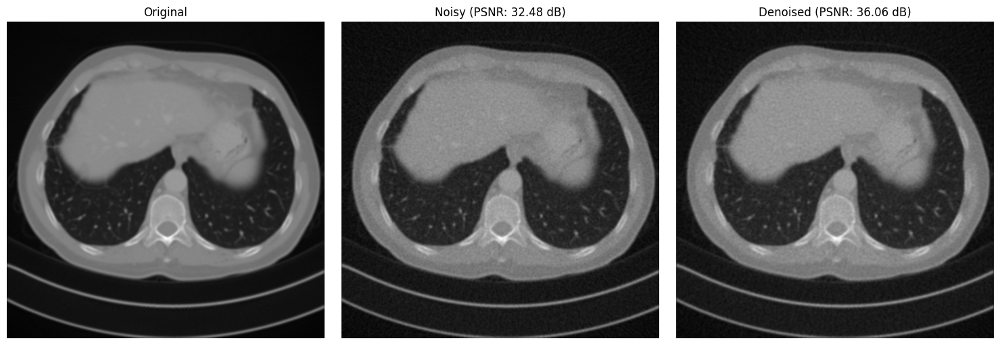

In [14]:
results = denoise_and_evaluate(
    model_path="../Downloads/model_epoch0040.pth",
    clean_path="../Documents/ct_dataset_extracted_with_gt/test/L067_L067_slice_020_gt.mat",
    noisy_path="../Documents/ct_dataset_extracted_with_gt/test/L067_L067_slice_020_noisy1.mat",
)


Processing: L067_L067_slice_020_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.48 dB
PSNR between Original and Denoised: 36.06 dB
PSNR Improvement: 3.59 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_020


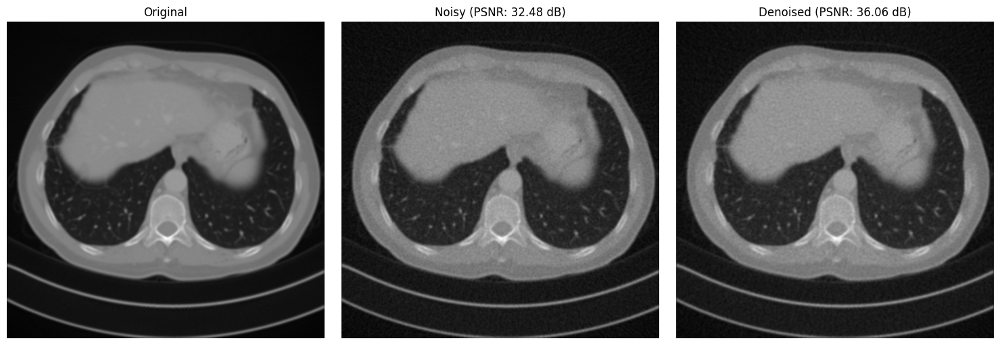


Processing: L067_L067_slice_022_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.41 dB
PSNR between Original and Denoised: 35.70 dB
PSNR Improvement: 3.29 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_022


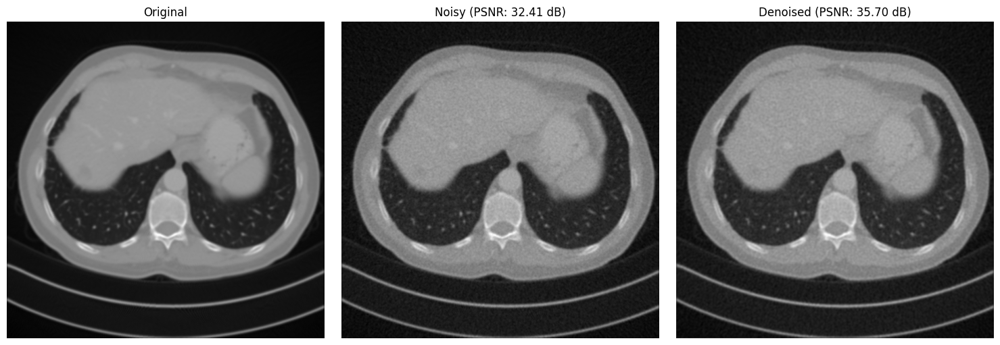


Processing: L067_L067_slice_053_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.26 dB
PSNR between Original and Denoised: 35.17 dB
PSNR Improvement: 2.91 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_053


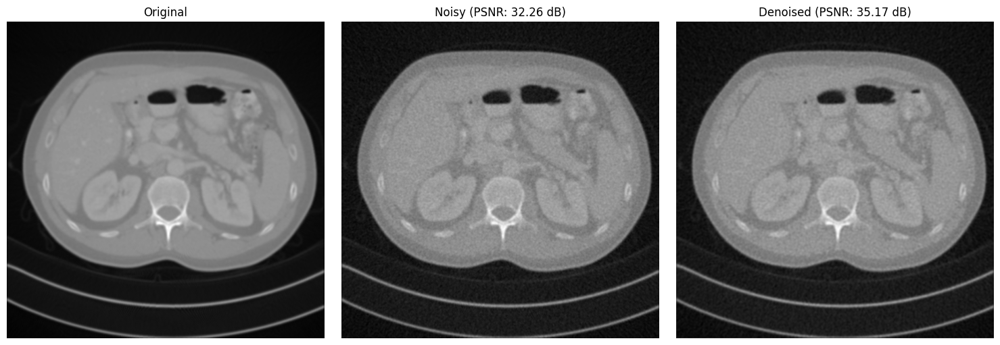


Processing: L067_L067_slice_055_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 31.44 dB
PSNR between Original and Denoised: 34.45 dB
PSNR Improvement: 3.01 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_055


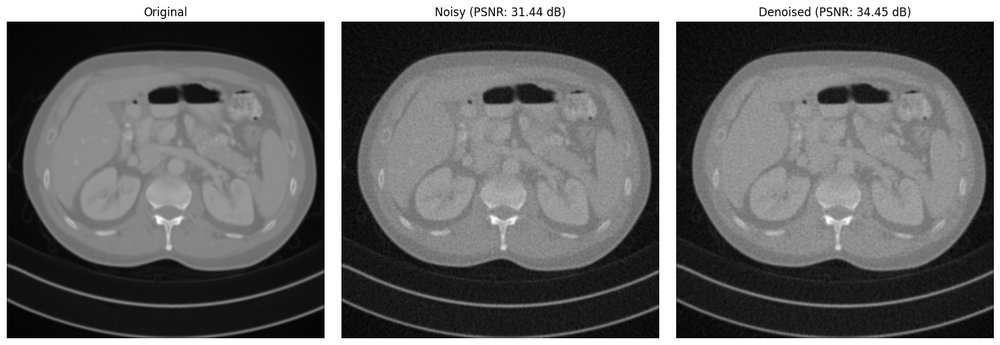


Processing: L067_L067_slice_110_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 33.62 dB
PSNR between Original and Denoised: 38.00 dB
PSNR Improvement: 4.38 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_110


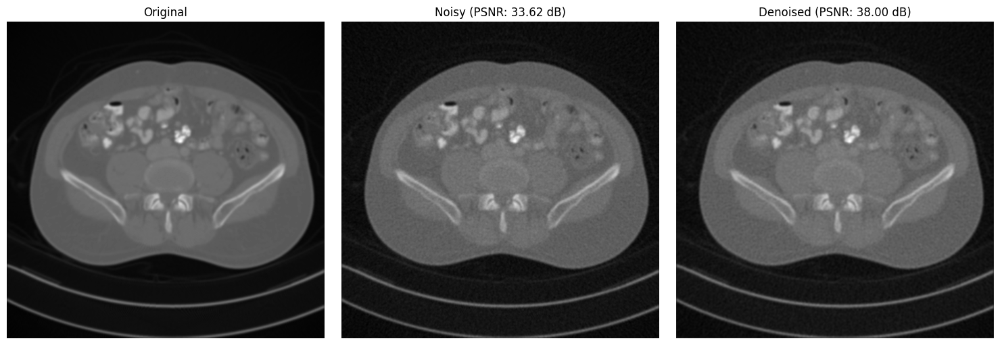


Processing: L067_L067_slice_118_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 31.59 dB
PSNR between Original and Denoised: 35.36 dB
PSNR Improvement: 3.77 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_118


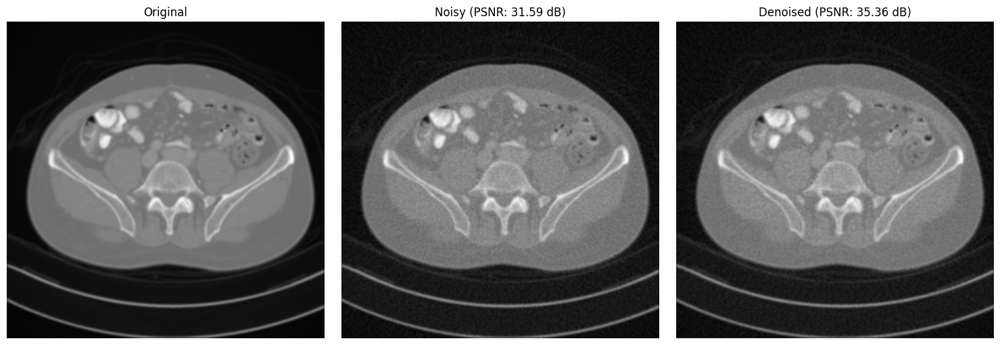


Processing: L067_L067_slice_140_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 30.97 dB
PSNR between Original and Denoised: 34.11 dB
PSNR Improvement: 3.13 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_140


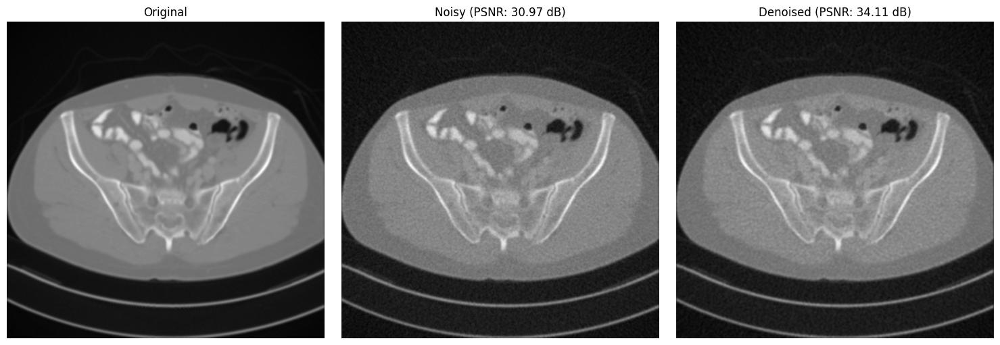


Processing: L067_L067_slice_162_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 31.18 dB
PSNR between Original and Denoised: 34.37 dB
PSNR Improvement: 3.20 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_162


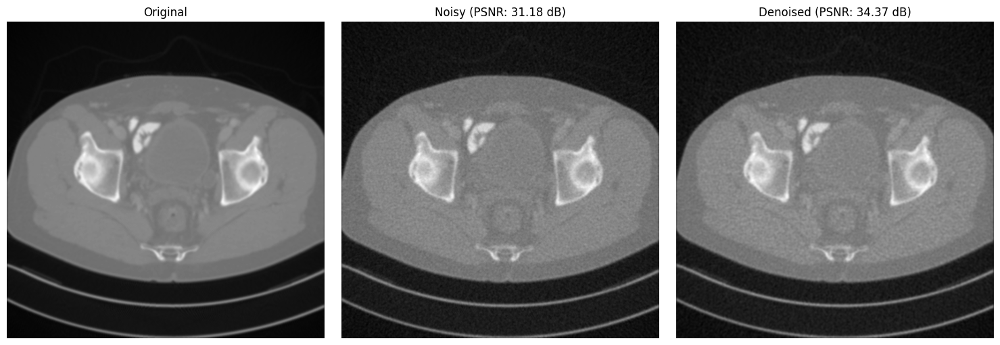


Processing: L067_L067_slice_181_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 31.27 dB
PSNR between Original and Denoised: 34.17 dB
PSNR Improvement: 2.90 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_181


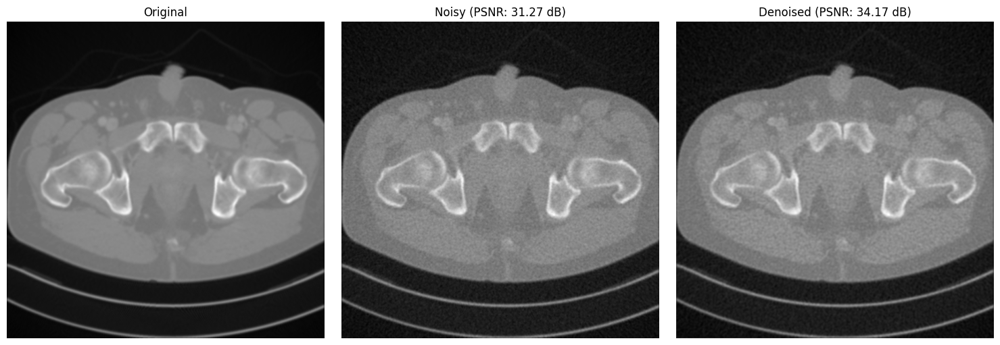


Processing: L067_L067_slice_202_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 33.21 dB
PSNR between Original and Denoised: 36.65 dB
PSNR Improvement: 3.44 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_202


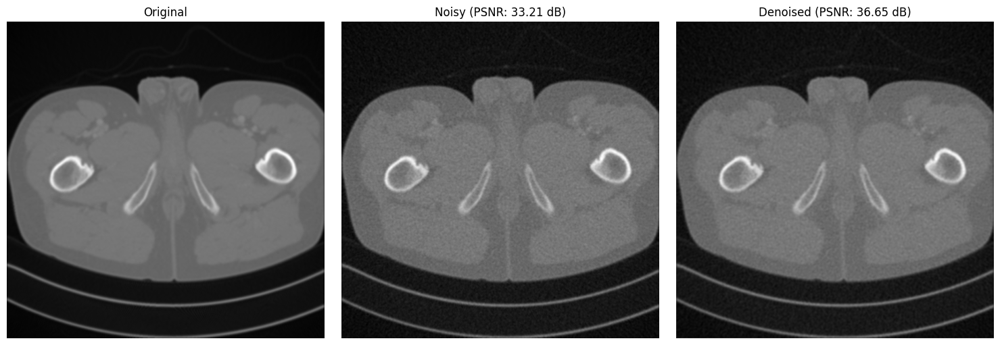


Processing: L067_L067_slice_213_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 33.16 dB
PSNR between Original and Denoised: 36.30 dB
PSNR Improvement: 3.14 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_213


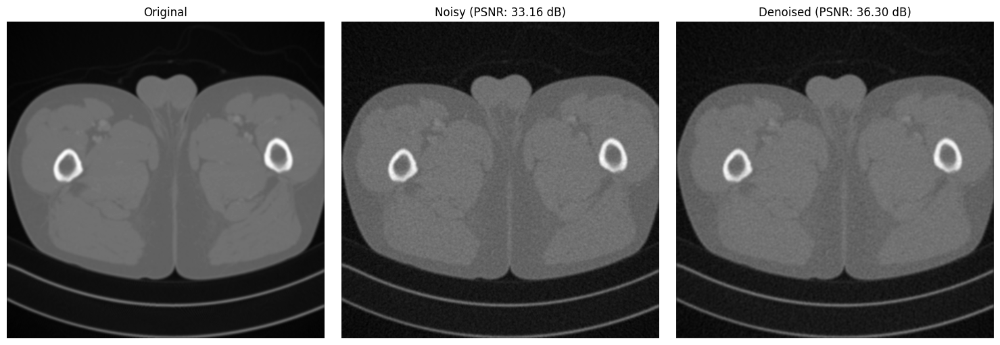


Processing: L067_L067_slice_221_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.25 dB
PSNR between Original and Denoised: 36.36 dB
PSNR Improvement: 4.12 dB
Results saved to ../Documents/ct_denoised_results/L067_L067_slice_221


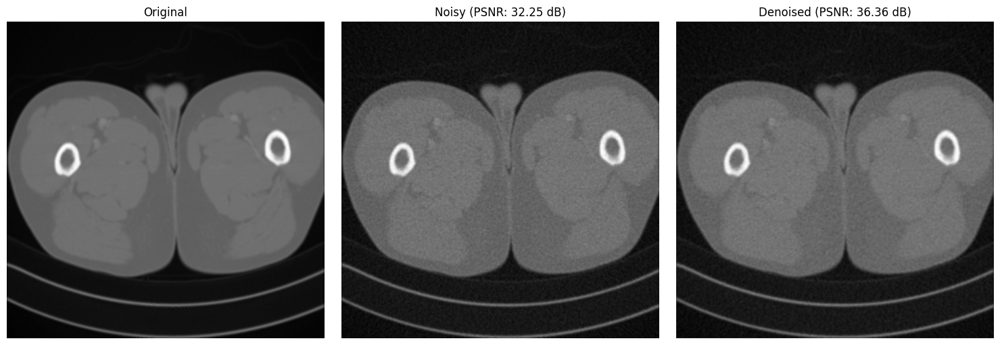


Processing: L096_L096_slice_009_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 36.38 dB
PSNR between Original and Denoised: 39.70 dB
PSNR Improvement: 3.32 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_009


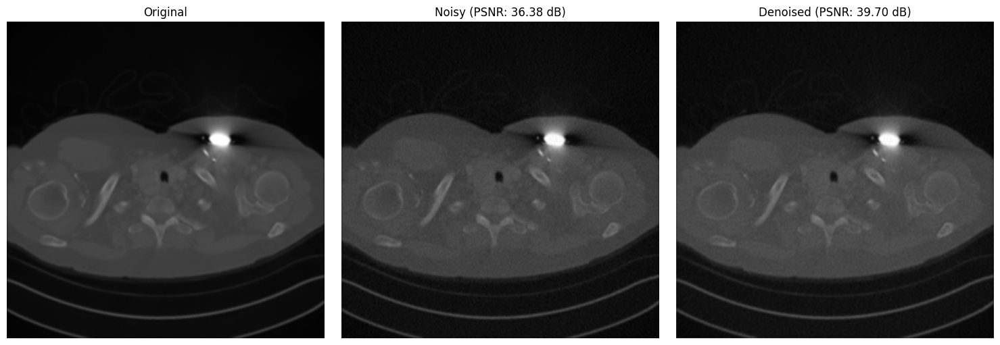


Processing: L096_L096_slice_011_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 36.17 dB
PSNR between Original and Denoised: 39.66 dB
PSNR Improvement: 3.50 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_011


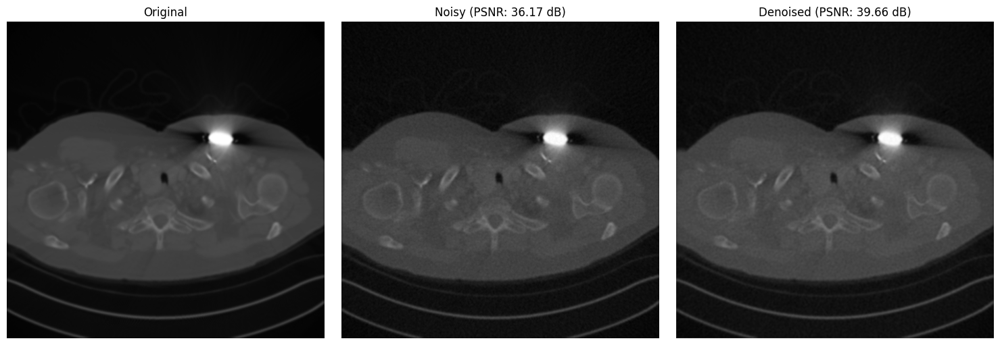


Processing: L096_L096_slice_020_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 36.51 dB
PSNR between Original and Denoised: 38.91 dB
PSNR Improvement: 2.40 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_020


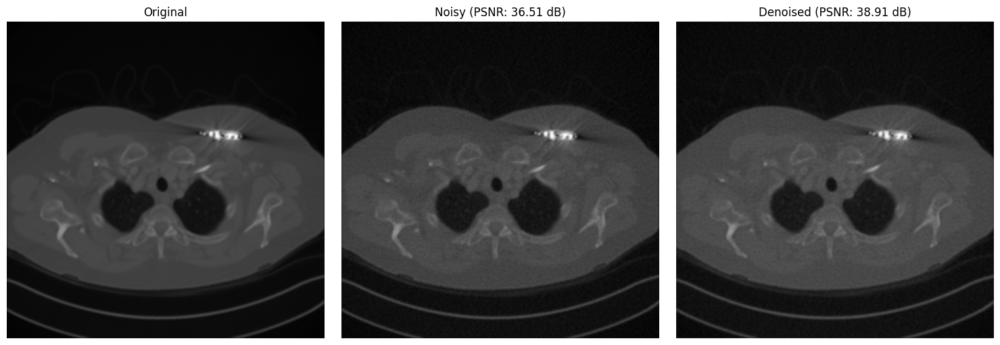


Processing: L096_L096_slice_022_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 35.70 dB
PSNR between Original and Denoised: 39.34 dB
PSNR Improvement: 3.64 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_022


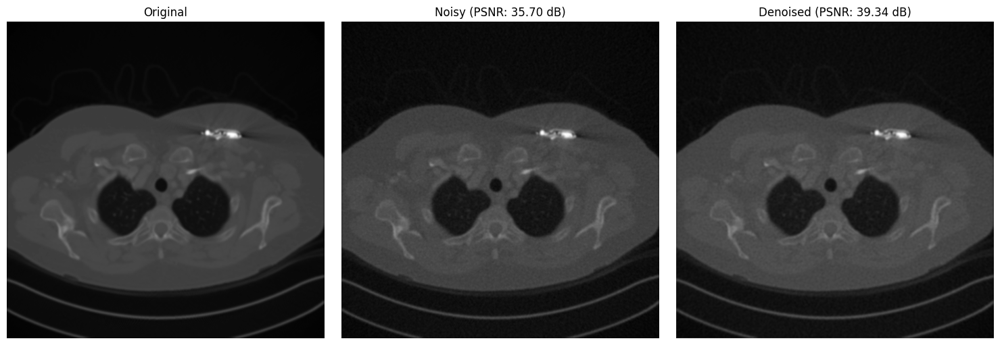


Processing: L096_L096_slice_035_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 33.59 dB
PSNR between Original and Denoised: 37.70 dB
PSNR Improvement: 4.11 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_035


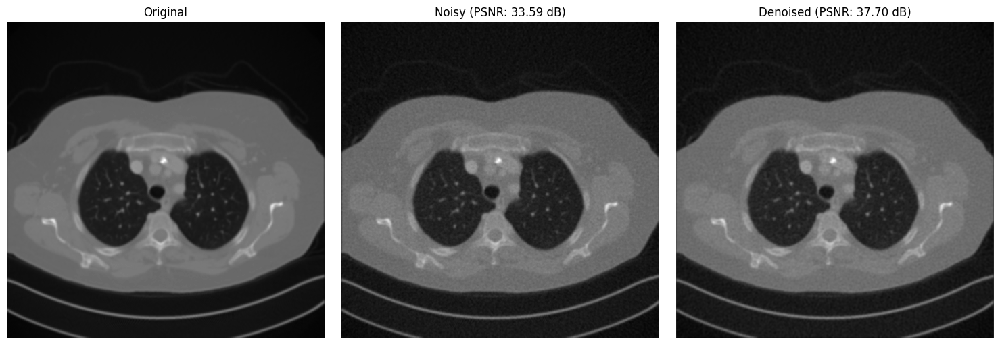


Processing: L096_L096_slice_055_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.03 dB
PSNR between Original and Denoised: 36.38 dB
PSNR Improvement: 4.35 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_055


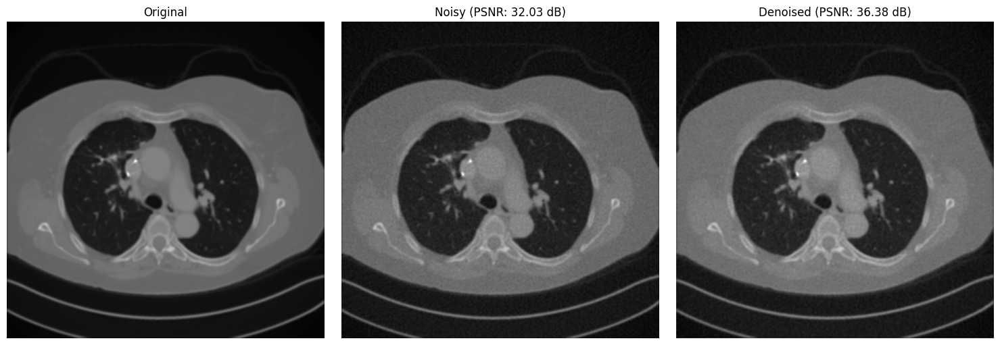


Processing: L096_L096_slice_063_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.42 dB
PSNR between Original and Denoised: 36.22 dB
PSNR Improvement: 3.80 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_063


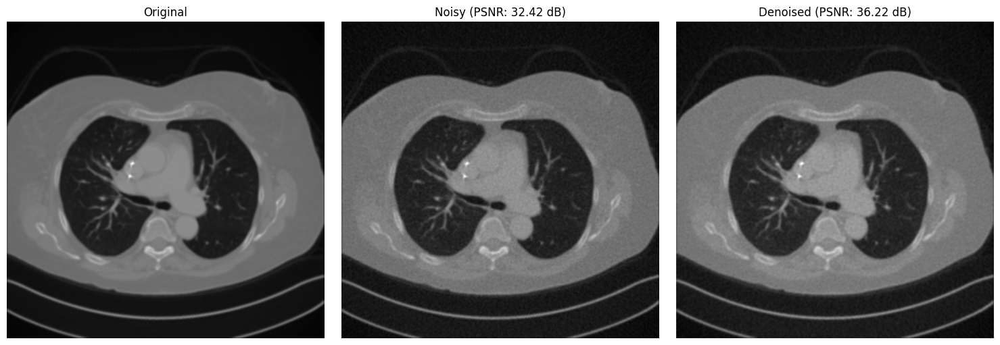


Processing: L096_L096_slice_074_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 34.63 dB
PSNR between Original and Denoised: 39.61 dB
PSNR Improvement: 4.98 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_074


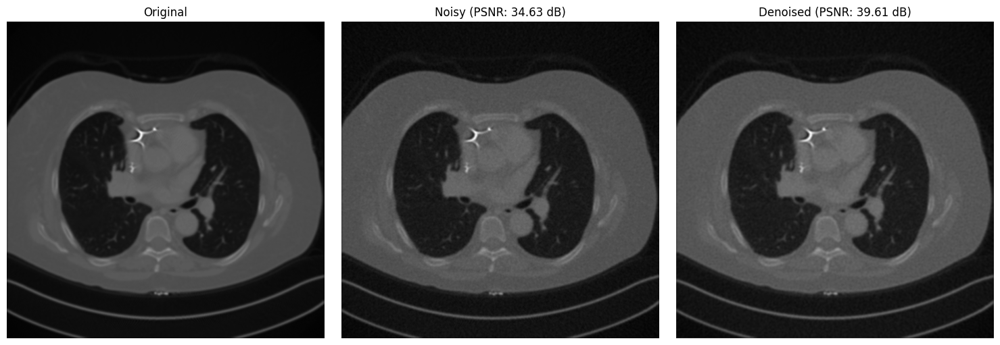


Processing: L096_L096_slice_081_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 33.23 dB
PSNR between Original and Denoised: 37.37 dB
PSNR Improvement: 4.14 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_081


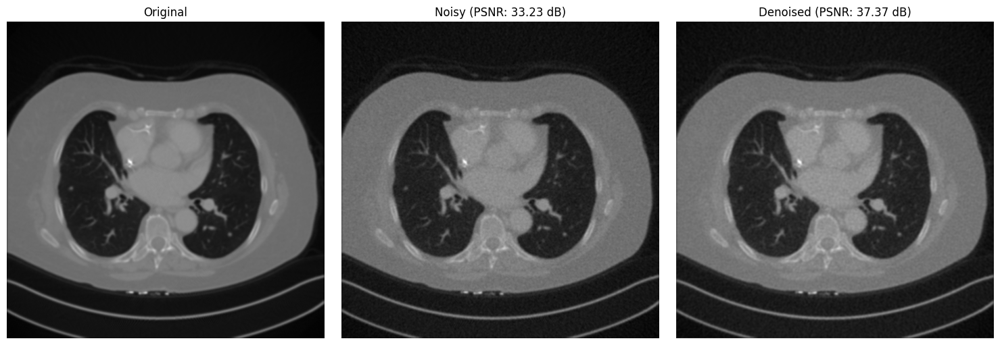


Processing: L096_L096_slice_090_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.49 dB
PSNR between Original and Denoised: 35.72 dB
PSNR Improvement: 3.23 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_090


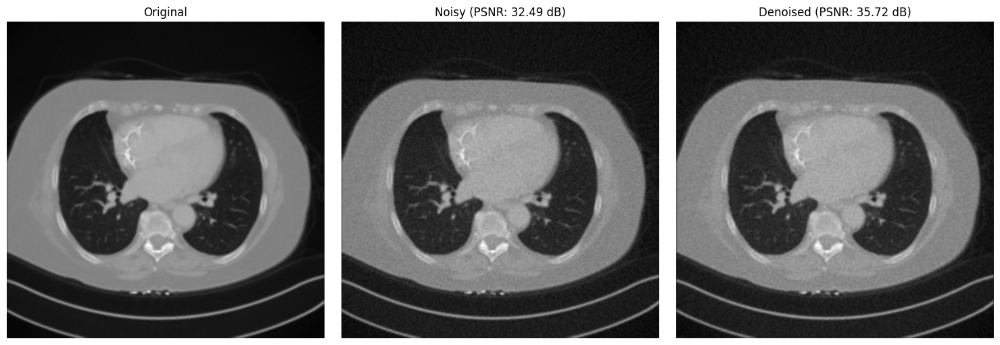


Processing: L096_L096_slice_095_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 30.78 dB
PSNR between Original and Denoised: 34.07 dB
PSNR Improvement: 3.30 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_095


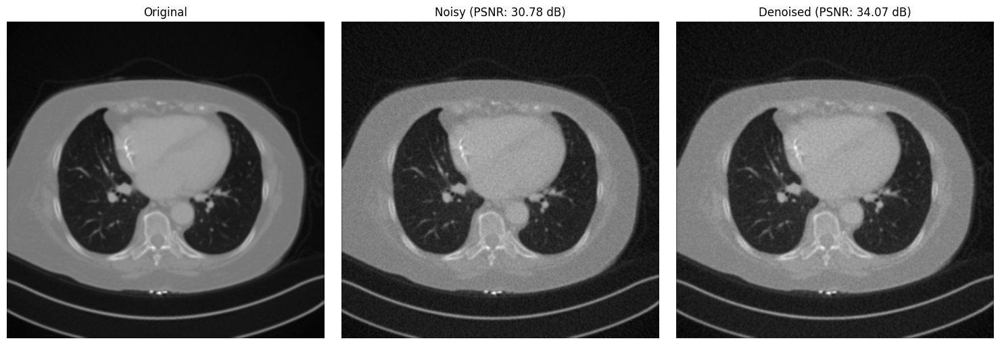


Processing: L096_L096_slice_105_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 32.49 dB
PSNR between Original and Denoised: 36.22 dB
PSNR Improvement: 3.73 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_105


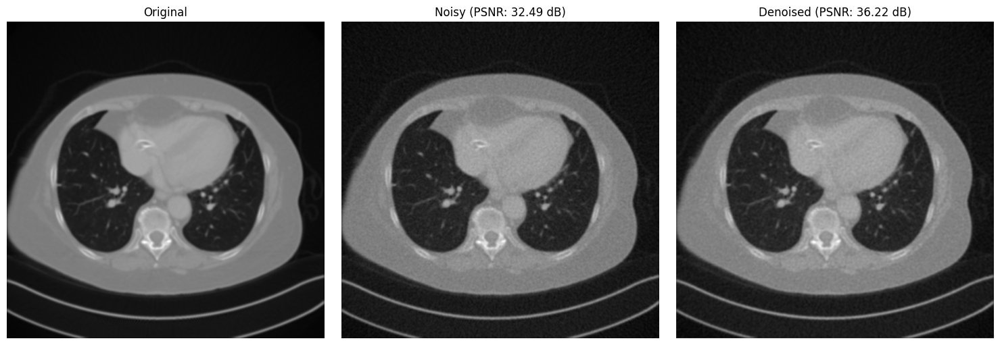


Processing: L096_L096_slice_107_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 30.79 dB
PSNR between Original and Denoised: 33.82 dB
PSNR Improvement: 3.04 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_107


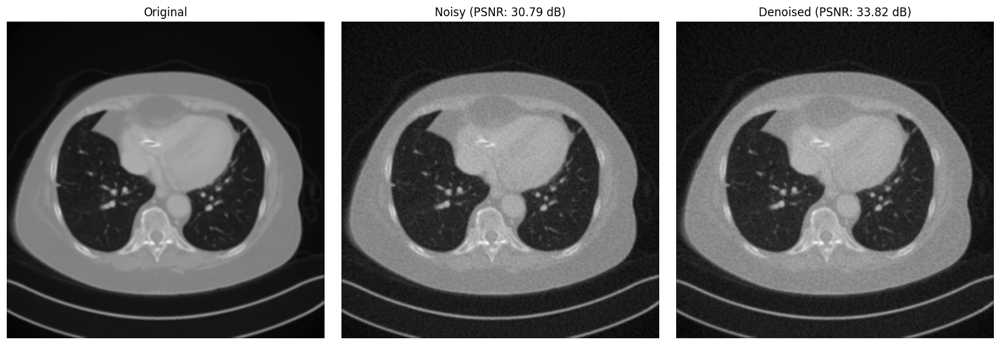


Processing: L096_L096_slice_124_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 31.50 dB
PSNR between Original and Denoised: 35.04 dB
PSNR Improvement: 3.54 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_124


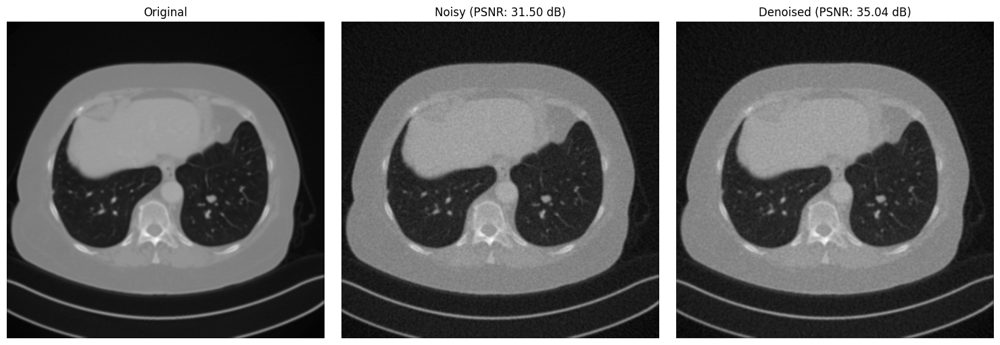


Processing: L096_L096_slice_126_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 33.06 dB
PSNR between Original and Denoised: 36.59 dB
PSNR Improvement: 3.53 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_126


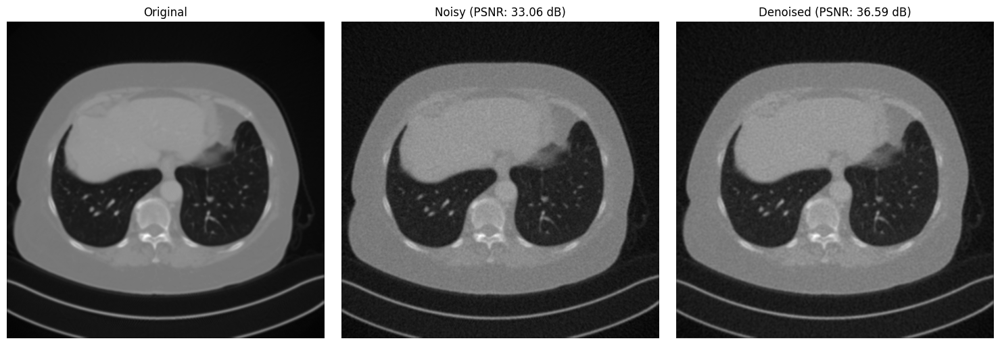


Processing: L096_L096_slice_133_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 28.37 dB
PSNR between Original and Denoised: 30.41 dB
PSNR Improvement: 2.04 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_133


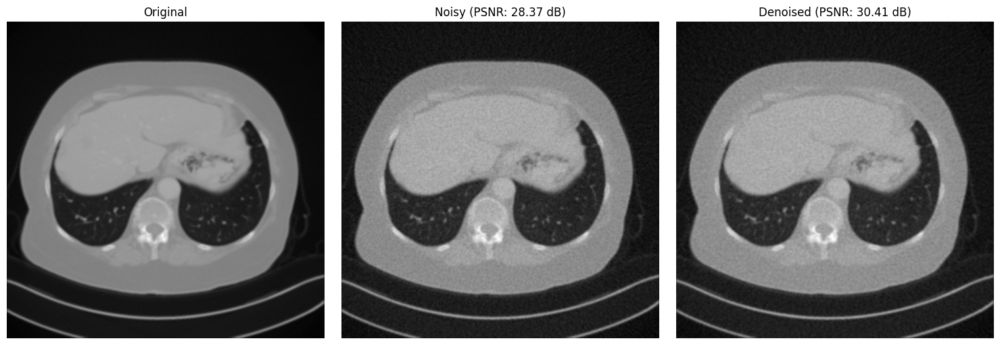


Processing: L096_L096_slice_134_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 29.47 dB
PSNR between Original and Denoised: 31.97 dB
PSNR Improvement: 2.50 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_134


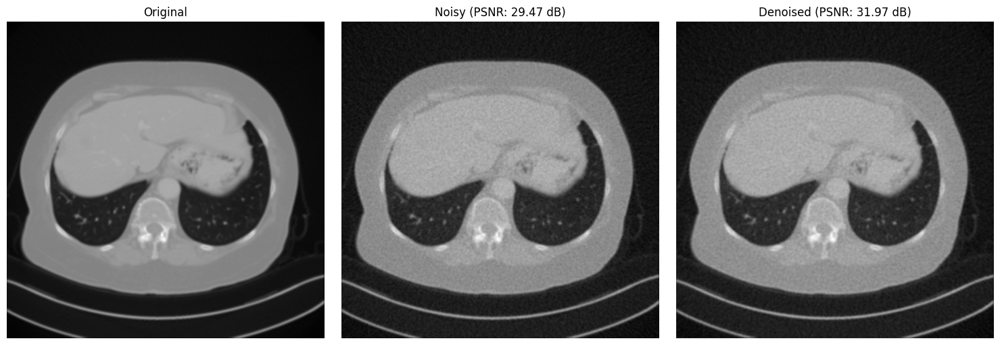


Processing: L096_L096_slice_143_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 30.36 dB
PSNR between Original and Denoised: 33.45 dB
PSNR Improvement: 3.09 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_143


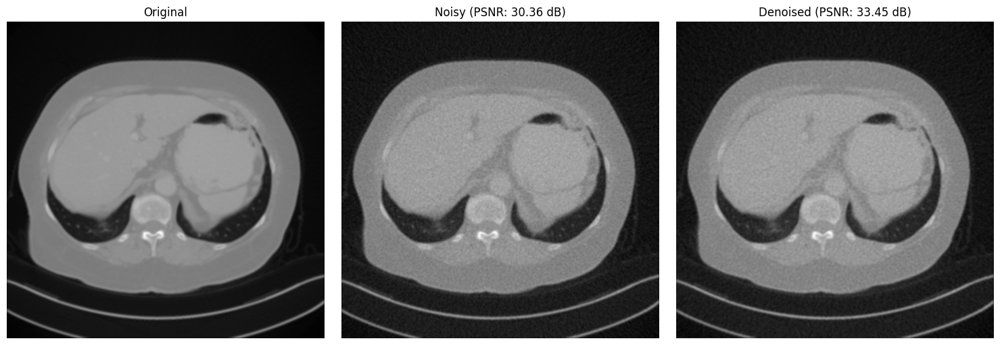


Processing: L096_L096_slice_145_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 31.70 dB
PSNR between Original and Denoised: 34.90 dB
PSNR Improvement: 3.21 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_145


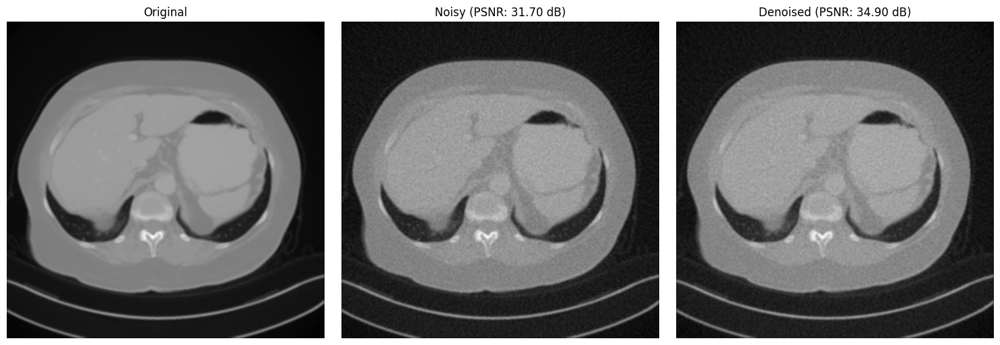


Processing: L096_L096_slice_146_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...
PSNR between Original and Noisy: 31.39 dB
PSNR between Original and Denoised: 34.53 dB
PSNR Improvement: 3.15 dB
Results saved to ../Documents/ct_denoised_results/L096_L096_slice_146


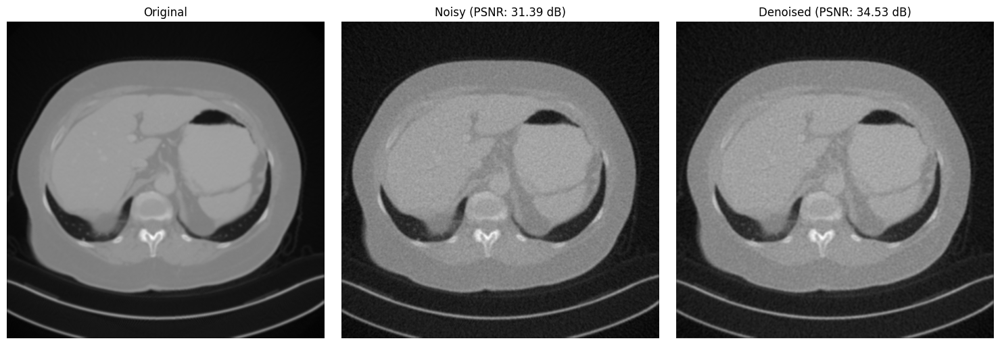


Processing: L096_L096_slice_162_gt.mat
Using device: cpu
Loading model from ../Downloads/model_epoch0040.pth
Running denoising model...



KeyboardInterrupt



In [46]:
def run_on_all_test_images(model_path, test_dir, output_dir=None):
    # Collect all _gt.mat files in the test directory
    gt_files = [f for f in os.listdir(test_dir) if f.endswith('_gt.mat')]
    gt_files.sort()

    improvements = []
    all_results = []

    for gt_file in gt_files:
        clean_path = os.path.join(test_dir, gt_file)
        noisy_path = clean_path.replace('_gt.mat', '_noisy1.mat')  # assume noisy1 exists

        if not os.path.exists(noisy_path):
            print(f"Skipping {gt_file} – matching noisy file not found.")
            continue

        print(f"\nProcessing: {gt_file}")

        # Define subfolder for each result (optional)
        if output_dir:
            case_name = gt_file.replace('_gt.mat', '')
            case_output_dir = os.path.join(output_dir, case_name)
        else:
            case_output_dir = None

        result = denoise_and_evaluate(
            model_path=model_path,
            clean_path=clean_path,
            noisy_path=noisy_path,
            norm_method='adaptive',
            output_dir=case_output_dir
        )

        improvements.append(result['improvement'])
        all_results.append(result)

    avg_improvement = np.mean(improvements)
    print(f"\n Average PSNR improvement over {len(improvements)} images: {avg_improvement:.2f} dB")
    return all_results, avg_improvement

# === Run the batch processing ===
if __name__ == "__main__":
    model_path = "../Downloads/model_epoch0040.pth"
    test_dir = "../Documents/ct_dataset_extracted_with_gt/test"
    output_dir = "../Documents/ct_denoised_results"

    results, avg_db_gain = run_on_all_test_images(model_path, test_dir, output_dir)


Using device: cpu
Loading model from ../Downloads/model_epoch0160.pth
Running denoising model...
PSNR between Original and Noisy: 39.87 dB
PSNR between Original and Denoised: 40.55 dB
PSNR Improvement: 0.67 dB


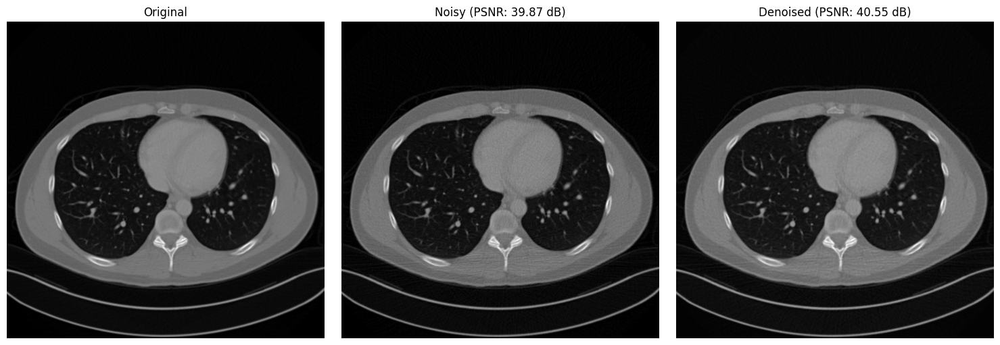

In [16]:
results = denoise_and_evaluate(
    model_path="../Downloads/model_epoch0160.pth",
    clean_path="../Downloads/Dataset_AAPM/FD_QD/FD/L333/full_3mm/L333_FD_3_1.CT.0001.0001.2015.12.22.20.18.05.702762.358508309.IMA",
    noisy_path="../Downloads/Dataset_AAPM/FD_QD/QD/L333/quarter_3mm/L333_QD_3_1.CT.0003.0001.2015.12.22.20.44.15.611815.358721840.IMA",
)

In [15]:
import pydicom

def load_image(file_path, expected_key):
    """Loads an image from .mat or .IMA format"""
    if file_path.endswith('.mat'):
        mat = io.loadmat(file_path)
        if expected_key in mat:
            return mat[expected_key].astype(np.float32)
        else:
            # Try fallback: first non-meta key
            keys = [k for k in mat.keys() if not k.startswith('__')]
            return mat[keys[0]].astype(np.float32)
    elif file_path.endswith('.IMA'):
        dcm = pydicom.dcmread(file_path)
        image = dcm.pixel_array.astype(np.float32)
        # Optional: HU correction
        if hasattr(dcm, "RescaleIntercept") and hasattr(dcm, "RescaleSlope"):
            image = image * float(dcm.RescaleSlope) + float(dcm.RescaleIntercept)
        return image
    else:
        raise ValueError(f"Unsupported file format: {file_path}")

def denoise_and_evaluate(model_path, clean_path, noisy_path, norm_method='adaptive', output_dir=None):
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Load model
    print(f"Loading model from {model_path}")
    model = ResNet(nch_in=1, nch_out=1, nch_ker=64, norm='bnorm')
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['netG'])        
    model.to(device)
    model.eval()

    # Load clean & noisy images from .IMA or .mat
    clean_img = load_image(clean_path, expected_key='clean_image')
    noisy_img = load_image(noisy_path, expected_key='noisy_image')

    # Preprocess
    clean_img = clean_img.astype(np.float32)
    noisy_img = noisy_img.astype(np.float32)

    def normalize_image(img, method='adaptive'):
        min_val, max_val = img.min(), img.max()
        if max_val > min_val:
            norm = (img - min_val) / (max_val - min_val)
        else:
            norm = np.zeros_like(img)
        return norm  # CLAHE can be added later if needed

    clean_norm = normalize_image(clean_img, norm_method)
    noisy_norm = normalize_image(noisy_img, norm_method)
    noisy_input = np.expand_dims(noisy_norm, axis=(0, 1))  # [H,W] -> [1,1,H,W]
    noisy_tensor = torch.from_numpy(noisy_input).to(device)

    # Inference
    print("Running denoising model...")
    with torch.no_grad():
        output_tensor = model(noisy_tensor)
    output = output_tensor.cpu().numpy().squeeze()

    # Postprocess for evaluation and display
    clean_img_2d = clean_norm.squeeze()
    noisy_img_2d = noisy_norm.squeeze()
    output_img_2d = output.squeeze()

    if len(output_img_2d.shape) == 3 and output_img_2d.shape[0] <= 3:
        output_img_2d = np.transpose(output_img_2d, (1, 2, 0))

    # PSNR
    psnr_noisy = calculate_psnr(clean_img_2d, noisy_img_2d)
    psnr_output = calculate_psnr(clean_img_2d, output_img_2d)

    print(f"PSNR between Original and Noisy: {psnr_noisy:.2f} dB")
    print(f"PSNR between Original and Denoised: {psnr_output:.2f} dB")
    print(f"PSNR Improvement: {psnr_output - psnr_noisy:.2f} dB")

    # Visualization
    plt.figure(figsize=(15, 5))
    plt.subplot(131); plt.imshow(clean_img_2d, cmap='gray'); plt.title('Original'); plt.axis('off')
    plt.subplot(132); plt.imshow(noisy_img_2d, cmap='gray'); plt.title(f'Noisy (PSNR: {psnr_noisy:.2f} dB)'); plt.axis('off')
    plt.subplot(133); plt.imshow(output_img_2d, cmap='gray'); plt.title(f'Denoised (PSNR: {psnr_output:.2f} dB)'); plt.axis('off')
    plt.tight_layout()

    # Save results
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        clean_file = os.path.basename(clean_path).split('.')[0]
        noisy_file = os.path.basename(noisy_path).split('.')[0]

        plt.savefig(os.path.join(output_dir, 'denoising_result.png'), dpi=300)
        plt.imsave(os.path.join(output_dir, f"{clean_file}_original.png"), clean_img_2d, cmap='gray')
        plt.imsave(os.path.join(output_dir, f"{noisy_file}_noisy.png"), noisy_img_2d, cmap='gray')
        plt.imsave(os.path.join(output_dir, f"{noisy_file}_denoised.png"), output_img_2d, cmap='gray')

        io.savemat(os.path.join(output_dir, f"{clean_file}_original.mat"), {'clean_image': clean_img_2d})
        io.savemat(os.path.join(output_dir, f"{noisy_file}_noisy.mat"), {'noisy_image': noisy_img_2d})
        io.savemat(os.path.join(output_dir, f"{noisy_file}_denoised.mat"), {'denoised_image': output_img_2d})

        print(f"Results saved to {output_dir}")

    plt.show()

    return {
        'original': clean_img,
        'noisy': noisy_img,
        'denoised': output,
        'psnr_noisy': psnr_noisy,
        'psnr_denoised': psnr_output,
        'improvement': psnr_output - psnr_noisy
    }
